## HCP connectome dataset PCA properties

In [42]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import sklearn
from sklearn.decomposition import PCA
import torch
from torch.utils.data import Dataset, DataLoader
from data.data_utils import *
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
import importlib
import data.hcp_dataset
import data.dataset_utils 
import data.data_utils
importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
from data.hcp_dataset import *
from data.dataset_utils import *
from data.data_utils import *
from data.hcp_dataset import HCP_Base, HCP_Partition

### Load data

In [3]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0)

Extract data into np arrays for local analysis

In [4]:
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")

HCP_train_loader = DataLoader(HCP_train, batch_size=64, shuffle=True)
HCP_val_loader = DataLoader(HCP_val, batch_size=64, shuffle=True)
HCP_test_loader = DataLoader(HCP_test, batch_size=64, shuffle=True)

sc_train_matrices = HCP_Dataset.sc_upper_triangles[HCP_train.indices]
sc_train_avg = HCP_Dataset.sc_train_avg
sc_val_matrices = HCP_Dataset.sc_upper_triangles[HCP_val.indices]
sc_val_avg = np.mean(sc_val_matrices, axis=0)
sc_test_matrices = HCP_Dataset.sc_upper_triangles[HCP_test.indices]
sc_test_avg = np.mean(sc_test_matrices, axis=0)

fc_train_matrices = HCP_Dataset.fc_upper_triangles[HCP_train.indices]
fc_train_avg = HCP_Dataset.fc_train_avg
fc_val_matrices = HCP_Dataset.fc_upper_triangles[HCP_val.indices]
fc_val_avg = np.mean(fc_val_matrices, axis=0)
fc_test_matrices = HCP_Dataset.fc_upper_triangles[HCP_test.indices]
fc_test_avg = np.mean(fc_test_matrices, axis=0)

SC Train vs Val Pearson r: 0.9983357056068822
SC Train vs Test Pearson r: 0.9991294663581596
SC Val vs Test Pearson r: 0.9979011787466778


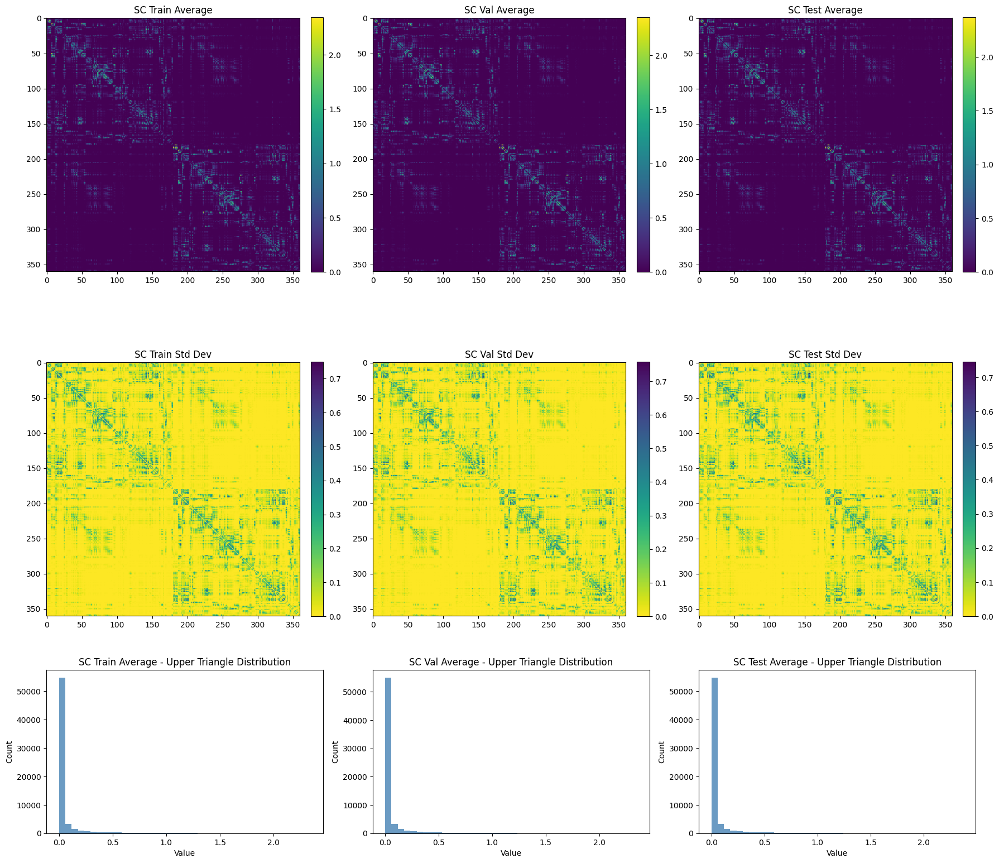

FC Train vs Val Pearson r: 0.9964534436294098
FC Train vs Test Pearson r: 0.9980708636132105
FC Val vs Test Pearson r: 0.9947440464581219


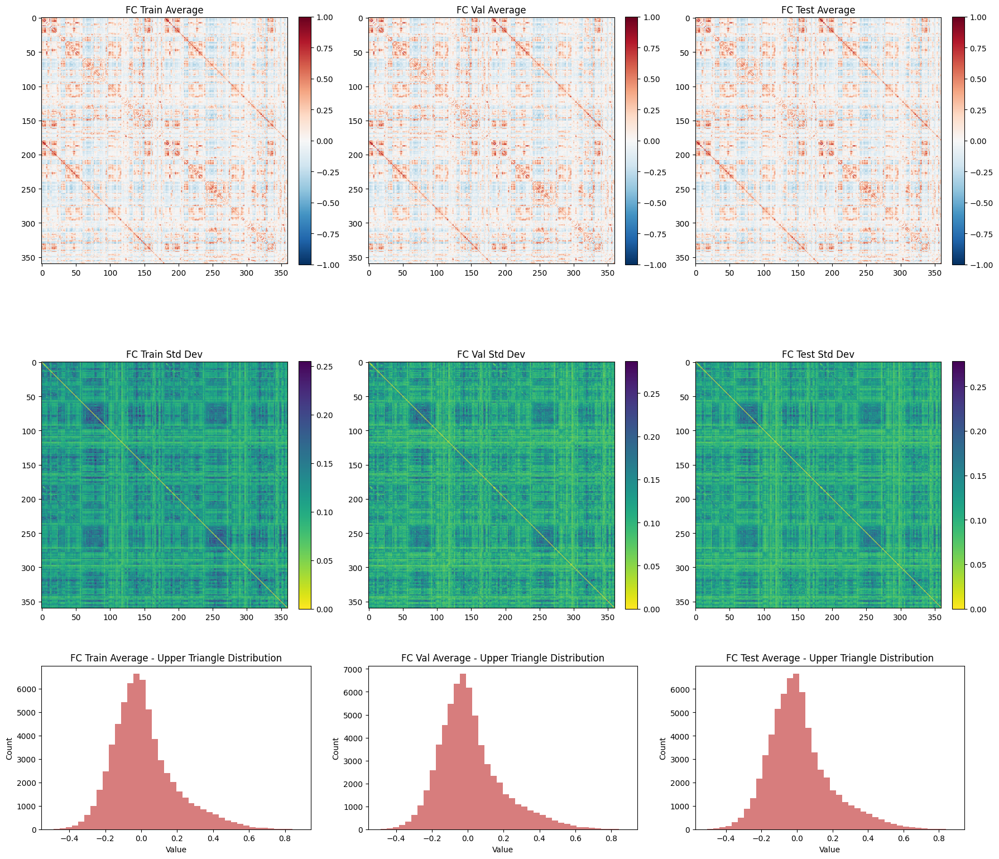

In [47]:
# Plot average and stddev SC matrices for train, val, test splits using tri2square

sc_tri_indices = np.triu_indices(360, k=1)
sc_train_avg_mat = tri2square(sc_train_avg, tri_indices=sc_tri_indices)
sc_val_avg_mat = tri2square(sc_val_avg, tri_indices=sc_tri_indices)
sc_test_avg_mat = tri2square(sc_test_avg, tri_indices=sc_tri_indices)

# Also compute standard deviation matrices for each split
sc_train_std = np.std(sc_train_matrices, axis=0)
sc_val_std = np.std(sc_val_matrices, axis=0)
sc_test_std = np.std(sc_test_matrices, axis=0)
sc_train_std_mat = tri2square(sc_train_std, tri_indices=sc_tri_indices)
sc_val_std_mat = tri2square(sc_val_std, tri_indices=sc_tri_indices)
sc_test_std_mat = tri2square(sc_test_std, tri_indices=sc_tri_indices)

print("SC Train vs Val Pearson r:", tri_corr(sc_train_avg_mat, sc_val_avg_mat))
print("SC Train vs Test Pearson r:", tri_corr(sc_train_avg_mat, sc_test_avg_mat))
print("SC Val vs Test Pearson r:", tri_corr(sc_val_avg_mat, sc_test_avg_mat))

# PLOT: avg, stddev imshow and histogram for each SC split
fig, axs = plt.subplots(3, 3, figsize=(18, 16), gridspec_kw={'height_ratios': [2, 2, 1]})
sc_avg_mats = [sc_train_avg_mat, sc_val_avg_mat, sc_test_avg_mat]
sc_std_mats = [sc_train_std_mat, sc_val_std_mat, sc_test_std_mat]
sc_titles = ["SC Train", "SC Val", "SC Test"]

for i, (avgmat, stdmat, title) in enumerate(zip(sc_avg_mats, sc_std_mats, sc_titles)):
    # Row 0: average imshow
    im1 = axs[0, i].imshow(avgmat, aspect='equal', cmap='viridis')
    axs[0, i].set_title(f"{title} Average")
    fig.colorbar(im1, ax=axs[0, i], fraction=0.046, pad=0.04)
    # Row 1: stddev imshow
    im2 = axs[1, i].imshow(stdmat, aspect='equal', cmap='viridis_r')
    axs[1, i].set_title(f"{title} Std Dev")
    fig.colorbar(im2, ax=axs[1, i], fraction=0.046, pad=0.04)
    # Row 2: Histogram of upper triangle (excluding diagonal) from average matrix
    iu = np.triu_indices_from(avgmat, k=1)
    axs[2, i].hist(avgmat[iu], bins=40, color='steelblue', alpha=0.8)
    axs[2, i].set_xlabel('Value')
    axs[2, i].set_ylabel('Count')
    axs[2, i].set_title(f'{title} Average - Upper Triangle Distribution')
plt.tight_layout()
plt.show()

# Plot average and stddev FC matrices for train, val, test splits using tri2square
fc_tri_indices = np.triu_indices(360, k=1)
fc_train_avg_mat = tri2square(fc_train_avg, tri_indices=fc_tri_indices)
fc_val_avg_mat = tri2square(fc_val_avg, tri_indices=fc_tri_indices)
fc_test_avg_mat = tri2square(fc_test_avg, tri_indices=fc_tri_indices)

# Also compute standard deviation matrices for each split
fc_train_std = np.std(fc_train_matrices, axis=0)
fc_val_std = np.std(fc_val_matrices, axis=0)
fc_test_std = np.std(fc_test_matrices, axis=0)
fc_train_std_mat = tri2square(fc_train_std, tri_indices=fc_tri_indices)
fc_val_std_mat = tri2square(fc_val_std, tri_indices=fc_tri_indices)
fc_test_std_mat = tri2square(fc_test_std, tri_indices=fc_tri_indices)

# Print the similarity (Pearson correlation) between each pair of average FCs
print("FC Train vs Val Pearson r:", tri_corr(fc_train_avg_mat, fc_val_avg_mat))
print("FC Train vs Test Pearson r:", tri_corr(fc_train_avg_mat, fc_test_avg_mat))
print("FC Val vs Test Pearson r:", tri_corr(fc_val_avg_mat, fc_test_avg_mat))

# PLOT: avg, stddev imshow and histogram for each FC split
fig, axs = plt.subplots(3, 3, figsize=(18, 16), gridspec_kw={'height_ratios': [2, 2, 1]})
fc_avg_mats = [fc_train_avg_mat, fc_val_avg_mat, fc_test_avg_mat]
fc_std_mats = [fc_train_std_mat, fc_val_std_mat, fc_test_std_mat]
fc_titles = ["FC Train", "FC Val", "FC Test"]

for i, (avgmat, stdmat, title) in enumerate(zip(fc_avg_mats, fc_std_mats, fc_titles)):
    # Row 0: average imshow
    im1 = axs[0, i].imshow(avgmat, aspect='equal', cmap='RdBu_r', vmin=-1, vmax=1)
    axs[0, i].set_title(f"{title} Average")
    fig.colorbar(im1, ax=axs[0, i], fraction=0.046, pad=0.04)
    # Row 1: stddev imshow
    im2 = axs[1, i].imshow(stdmat, aspect='equal', cmap='viridis_r')
    axs[1, i].set_title(f"{title} Std Dev")
    fig.colorbar(im2, ax=axs[1, i], fraction=0.046, pad=0.04)
    # Row 2: Histogram of upper triangle (excluding diagonal) from average matrix
    iu = np.triu_indices_from(avgmat, k=1)
    axs[2, i].hist(avgmat[iu], bins=40, color='indianred', alpha=0.8)
    axs[2, i].set_xlabel('Value')
    axs[2, i].set_ylabel('Count')
    axs[2, i].set_title(f'{title} Average - Upper Triangle Distribution')
plt.tight_layout()
plt.show()

### Define edge-wise and subject-wise PCA

In [6]:
import models
import importlib
importlib.reload(models)
from models import *

In [107]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def fit_pca(X):
    print('X.shape:', X.shape)
    pca = PCA(n_components=min(X.shape))
    pca.fit(X)

    B = pca.components_ # loadings i.e. orthonormal basis vectors (d by k)
    print('B.shape:', B.shape)
    print('B orthonormal:', np.allclose(B @ B.T, np.eye(B.shape[0]), atol=1e-6))
    C = pca.transform(X) # scores (n by k)
    print('C.shape:', C.shape)

    variance_explained = pca.explained_variance_ratio_
    cumulative_variance_explained = np.cumsum(variance_explained)

    return B, C, variance_explained, cumulative_variance_explained

def plot_pca_variance(variance_explained, cumulative_variance_explained=None, var_threshold=0.95, 
                      marker_size=2, max_components_for_bar=100, modality=None, parcellation=None):
    """
    Plot explained variance per PCA component and cumulative variance.
    If cumulative_variance_explained is not provided, will compute from variance_explained.
    Args:
        variance_explained: array-like, explained variance ratio for each PC.
        cumulative_variance_explained: array-like or None; will compute if None.
        var_threshold: float, cumulative variance threshold to annotate (default 0.95).
        marker_size: int, markersize for lines.
        max_components_for_bar: int, max number of bars to show for per-component chart.
        modality: str or None; e.g. "SC", for title.
        parcellation: str or None; e.g. "Glasser", for title.
    """
    if cumulative_variance_explained is None:
        cumulative_variance_explained = np.cumsum(variance_explained)

    num_components = len(variance_explained)
    components = np.arange(1, num_components + 1)
    n_components_to_plot = min(max_components_for_bar, num_components)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))

    # Left plot: cumulative variance
    ax1.plot(components, cumulative_variance_explained, marker="o", markersize=marker_size, color="blue", label="Cumulative Variance Explained")
    k_thresh = np.searchsorted(cumulative_variance_explained, var_threshold) + 1
    ax1.axhline(var_threshold, color='red', linestyle='--',
                label=f'{int(var_threshold*100)}% Variance (n_comps={k_thresh})')
    ax1.set_xlabel("Number of components")
    ax1.set_ylabel("Cumulative explained variance ratio")
    ax1.set_title("Cumulative Variance Explained")
    ax1.grid(True)
    ax1.legend()

    # Right plot: variance per component as bar chart
    ax2.bar(components[:n_components_to_plot], variance_explained[:n_components_to_plot], 
            alpha=0.7, color='slateblue', edgecolor='black', linewidth=0.5, label='Variance Explained')
    ax2.set_xlabel("Component number")
    ax2.set_ylabel("Explained variance ratio")
    ax2.set_title(f"Variance Explained per Component (first {n_components_to_plot})")
    ax2.grid(True, alpha=0.3, axis='y')

    plt.tight_layout()
    plt.show()


def plot_pc_loadings_and_connectomes(
    B, train_matrices, tri2square, tri_indices,
    pc_to_observe=0, n_display=3, connectome_type="sc"
):
    """
    Plots the loadings of the selected principal component and visualizes the connectomes
    for the subjects with the highest and lowest loadings along that component.

    Args:
        B: PCA components/weights matrix (n_components x n_subjects).
        train_matrices: Connectome matrix (n_subjects x n_edges).
        tri2square: Function to convert vectorized connectome to square matrix.
        sc_tri_indices: Indices in upper triangle for matrix rebuild.
        pc_to_observe: Integer, which principal component to observe (0-indexed).
        n_display: Integer, number of subjects to display for connectome visualization.
        connectome_type: str, "sc" (structural) or "fc" (functional); controls colormap.
    """
    # Choose colormap based on connectome type
    if connectome_type.lower() == "sc":
        connectome_cmap = "viridis"
    elif connectome_type.lower() == "fc":
        connectome_cmap = "RdBu_r"
    else:
        connectome_cmap = "RdBu_r"

    selected_pc = B[pc_to_observe, :]

    # Bar plot of PC loadings
    plt.figure(figsize=(10, 5))
    plt.bar(np.arange(len(selected_pc)), selected_pc, color='steelblue', width=1.0, align='center', edgecolor='none')
    plt.xlabel("Subject Index")
    plt.ylabel(f"Principal Component {pc_to_observe + 1} Loading")
    plt.title(f"Principal Component {pc_to_observe + 1} Loadings (Subject-wise PCA)")
    plt.xlim(-0.5, len(selected_pc) - 0.5)
    plt.tight_layout()
    plt.show()

    # Plot the connectomes for the subjects with top PC loadings
    top_subjects = np.argsort(selected_pc)[-n_display:][::-1]  # Indices of top n highest loadings

    fig, axes = plt.subplots(1, n_display, figsize=(3.6 * n_display, 4), constrained_layout=False)
    if n_display == 1:
        axes = [axes]
    for i, subj_idx in enumerate(top_subjects):
        connectome = train_matrices[subj_idx, :]
        conn_mat = tri2square(connectome, tri_indices)
        im = axes[i].imshow(conn_mat, aspect='equal', cmap=connectome_cmap)
        axes[i].set_title(f"Top {i + 1} (Subj {subj_idx})", fontsize=12)
        axes[i].axis("off")
        divider = make_axes_locatable(axes[i])
        cax = divider.append_axes("right", size="5%", pad=0.10)
        cbar = plt.colorbar(im, cax=cax, label="Connectome Value")
    fig.suptitle(f"Connectomes: Top {n_display} Subjects by PC{pc_to_observe + 1} Loading")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # Plot the connectomes for the subjects with bottom PC loadings
    bottom_subjects = np.argsort(selected_pc)[:n_display]  # Indices of n lowest loadings

    fig, axes = plt.subplots(1, n_display, figsize=(3.6 * n_display, 4), constrained_layout=False)
    if n_display == 1:
        axes = [axes]
    for i, subj_idx in enumerate(bottom_subjects):
        connectome = train_matrices[subj_idx, :]
        conn_mat = tri2square(connectome, tri_indices=sc_tri_indices)
        im = axes[i].imshow(conn_mat, aspect='equal', cmap=connectome_cmap)
        axes[i].set_title(f"Bottom {i + 1} (Subj {subj_idx})", fontsize=12)
        axes[i].axis("off")
        divider = make_axes_locatable(axes[i])
        cax = divider.append_axes("right", size="5%", pad=0.10)
        cbar = plt.colorbar(im, cax=cax, label="Connectome Value")
    fig.suptitle(f"Connectomes: Bottom {n_display} Subjects by PC{pc_to_observe + 1} Loading")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

#### SC evaluation

edge-wise

X.shape: (683, 64620)
B.shape: (683, 64620)
B orthonormal: True
C.shape: (683, 683)


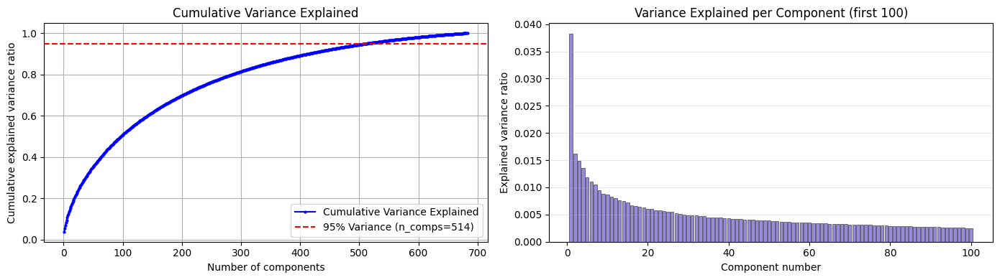

In [108]:
X = sc_train_matrices # n by d
B, C, variance_explained, cumulative_variance_explained = fit_pca(X)
plot_pca_variance(variance_explained, cumulative_variance_explained)

In the standard n by d case, PCA constructs an orthonormal basis of the data (B of shape d by k) that captures principal directions of variance in the edges across subjects. 100 PCs are required to explain 50% of the variance and 514 components to describe 95% of the variance, pointing towards nuanced layers of the covariance structure across edges in the connectome. Given that population variance tends to occur in the backbone of the population average connectome, we visualize the first PC, expecting larger weights in the backbone of the connectome.

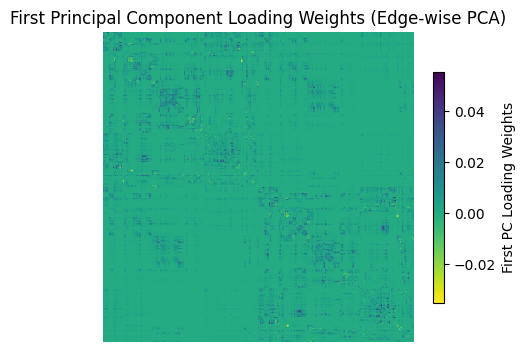

In [109]:
# Visualize the first PC loadings as a square matrix
first_pc = B[0, :]
pc_matrix = tri2square(first_pc, tri_indices=sc_tri_indices)
plt.figure(figsize=(5, 5))
im = plt.imshow(pc_matrix, cmap='viridis_r')
cbar = plt.colorbar(im, label="First PC Loading Weights", shrink=0.6)
plt.title("First Principal Component Loading Weights (Edge-wise PCA)")
plt.axis("off")
plt.show()

subject-wise

X.shape: (64620, 683)
B.shape: (683, 683)
B orthonormal: True
C.shape: (64620, 683)


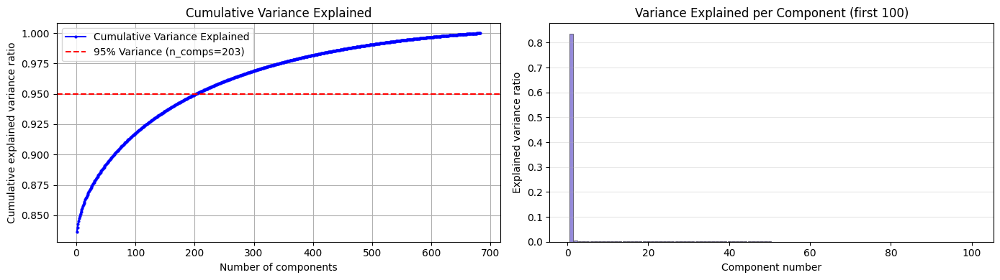

In [110]:
Y = sc_train_matrices.T # d by n
B, C, variance_explained, cumulative_variance_explained = fit_pca(Y)
plot_pca_variance(variance_explained, cumulative_variance_explained)

In the d by n case, PCA constructs an orthonormal basis of the data (B of shape n by k) capturing the principal directions of variance in the subjects across edges. In this setting the first principal component captures a disproportionate amount of variance across edges, which may point to a simple low rank structure of connectome structure in the population. Given prior knowledge that connectomes are highly similar to each other, we visualize the weights of the first PC to observe the loading structure on the subjects.

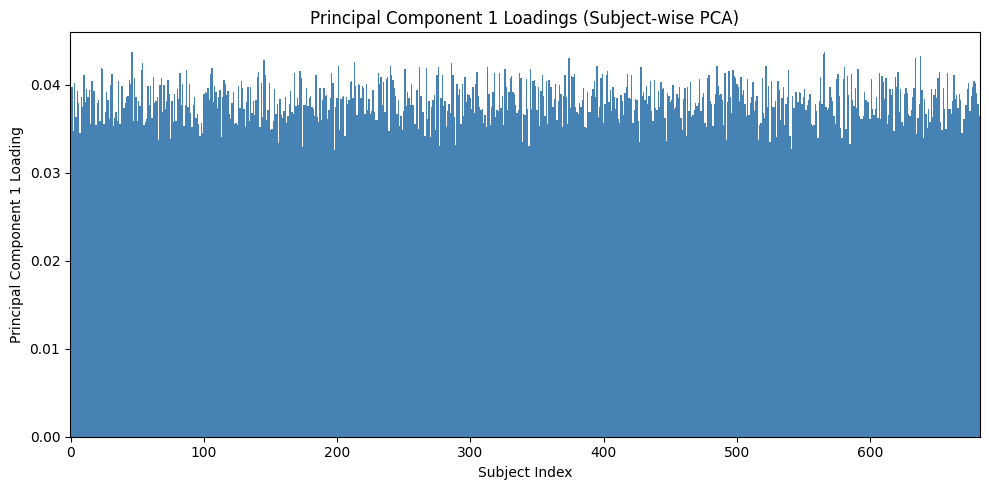

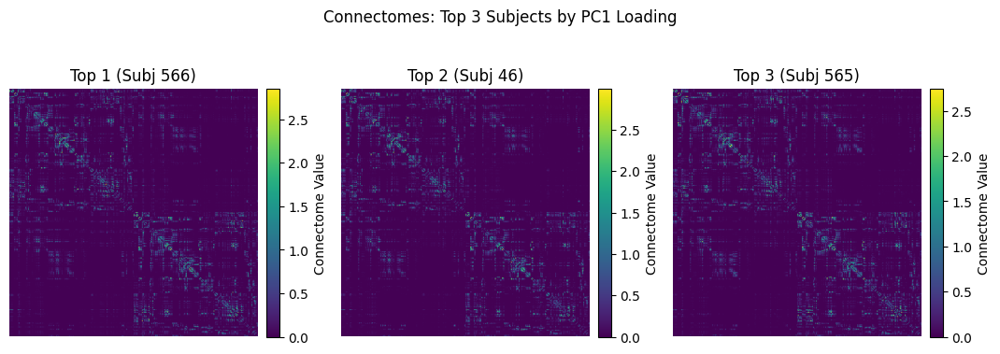

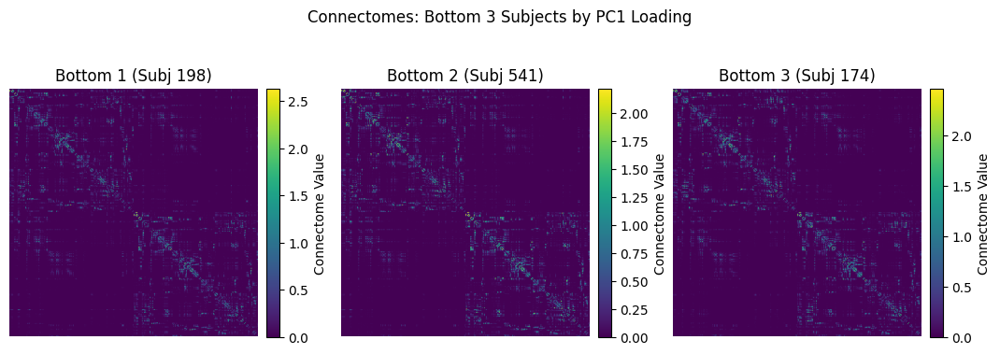

In [111]:
plot_pc_loadings_and_connectomes(
    B=B, 
    connectome_type="sc",
    train_matrices=sc_train_matrices,
    tri2square=tri2square, 
    tri_indices=sc_tri_indices, 
    pc_to_observe=0,  # You may change this value
    n_display=3       # You may change this value
)

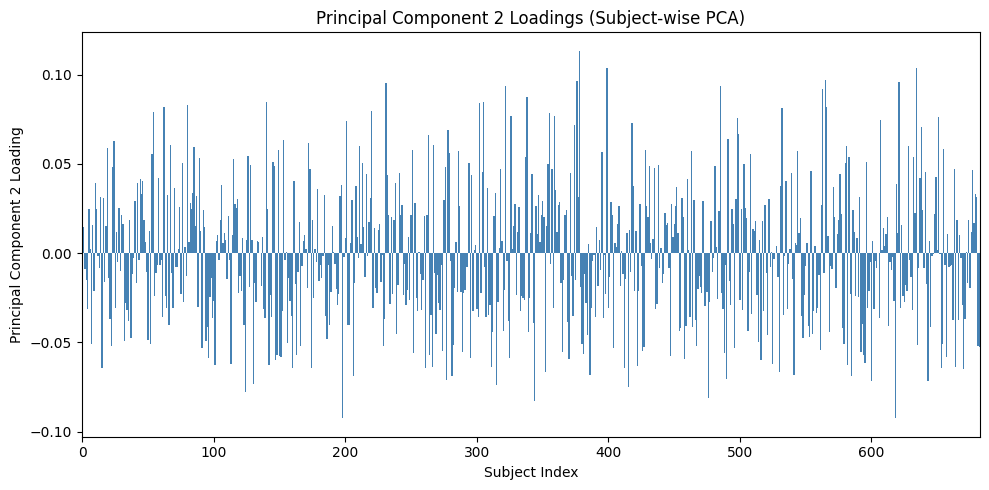

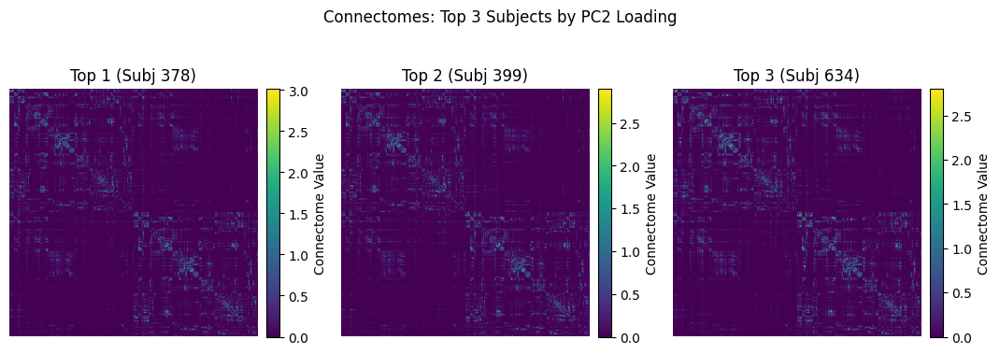

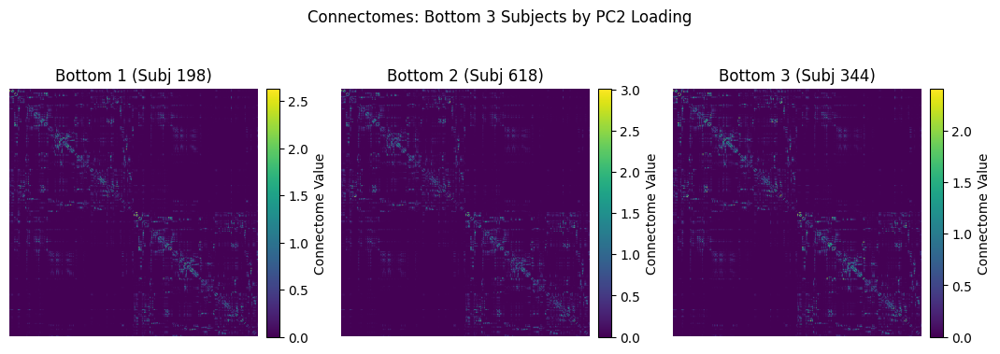

In [112]:
plot_pc_loadings_and_connectomes(
    B=B, 
    connectome_type="sc",
    train_matrices=sc_train_matrices,
    tri2square=tri2square, 
    tri_indices=sc_tri_indices, 
    pc_to_observe=1,  # You may change this value
    n_display=3       # You may change this value
)

### FC

edge-wise

X.shape: (683, 64620)


B.shape: (683, 64620)
B orthonormal: True
C.shape: (683, 683)


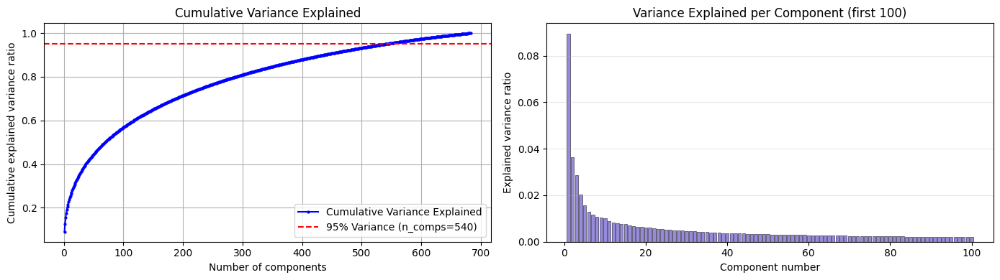

In [113]:
X = fc_train_matrices # n by d
B, C, variance_explained, cumulative_variance_explained = fit_pca(X)
plot_pca_variance(variance_explained, cumulative_variance_explained)

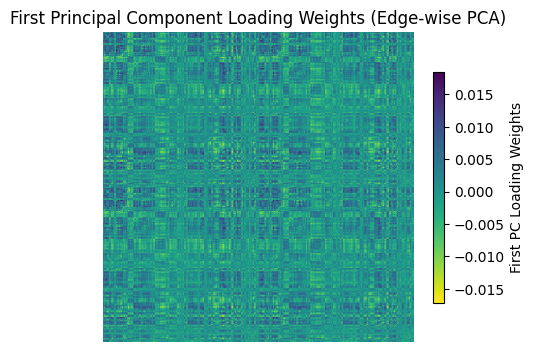

In [114]:
# Visualize the first PC loadings as a square matrix
first_pc = B[0, :]
pc_matrix = tri2square(first_pc, tri_indices=sc_tri_indices)
plt.figure(figsize=(5, 5))
im = plt.imshow(pc_matrix, cmap='viridis_r')
cbar = plt.colorbar(im, label="First PC Loading Weights", shrink=0.6)
plt.title("First Principal Component Loading Weights (Edge-wise PCA)")
plt.axis("off")
plt.show()

subject-wise

X.shape: (64620, 683)


B.shape: (683, 683)
B orthonormal: True
C.shape: (64620, 683)


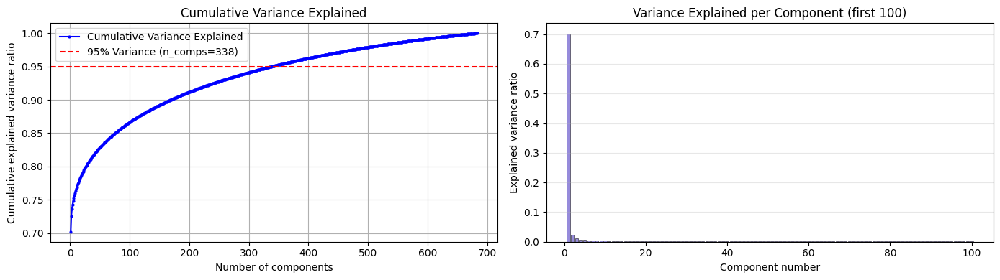

In [115]:
Y = fc_train_matrices.T # d by n
B, C, variance_explained, cumulative_variance_explained = fit_pca(Y)
plot_pca_variance(variance_explained, cumulative_variance_explained)

In [116]:
first_pc.shape

(64620,)

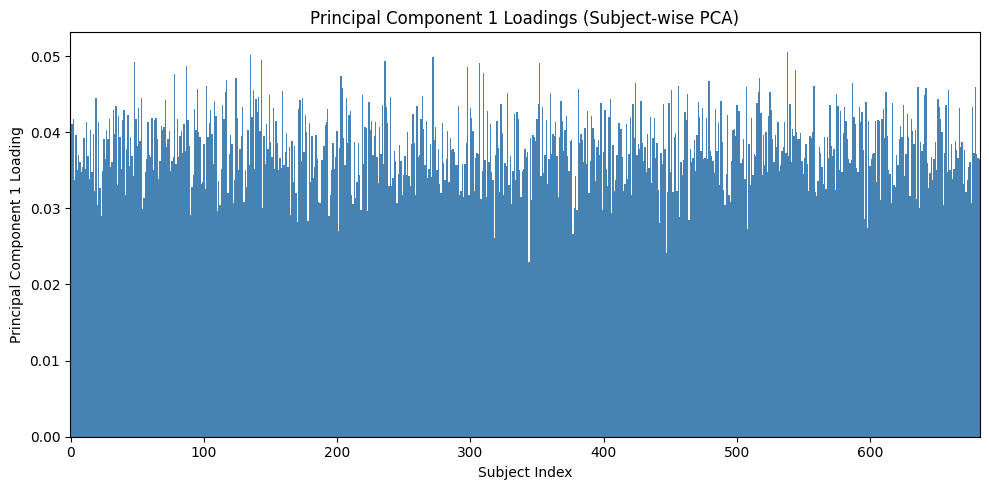

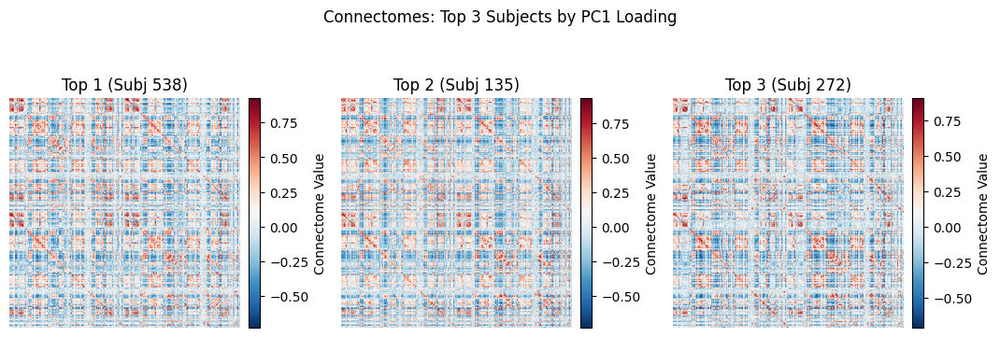

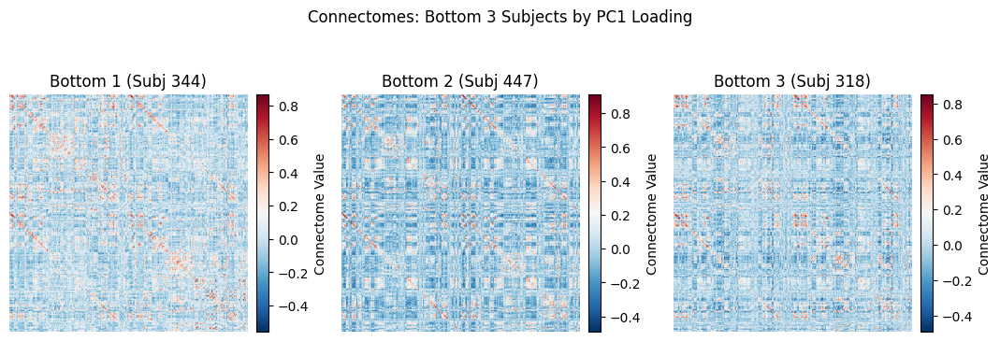

In [118]:
plot_pc_loadings_and_connectomes(
    B=B,
    connectome_type="fc",
    train_matrices=fc_train_matrices, 
    tri2square=tri2square, 
    tri_indices=sc_tri_indices, 
    pc_to_observe=0,  # You may change this value
    n_display=3       # You may change this value
)


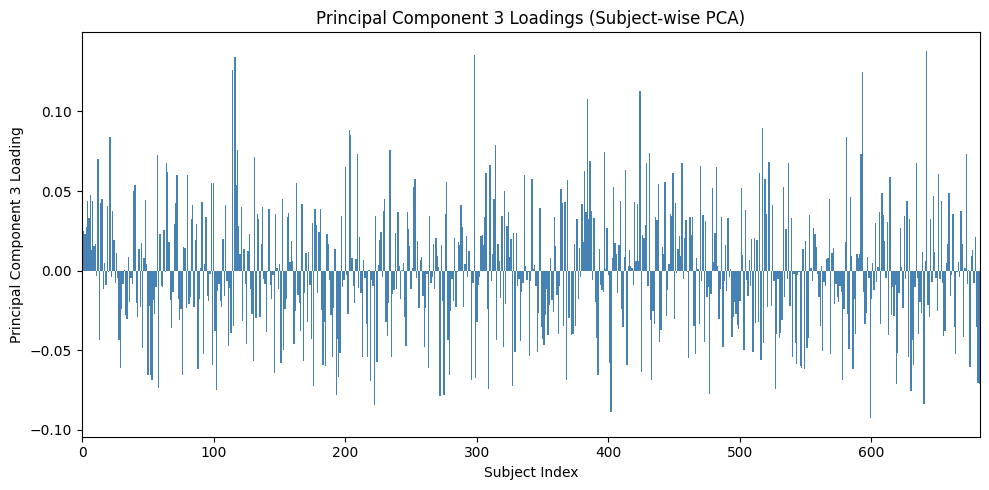

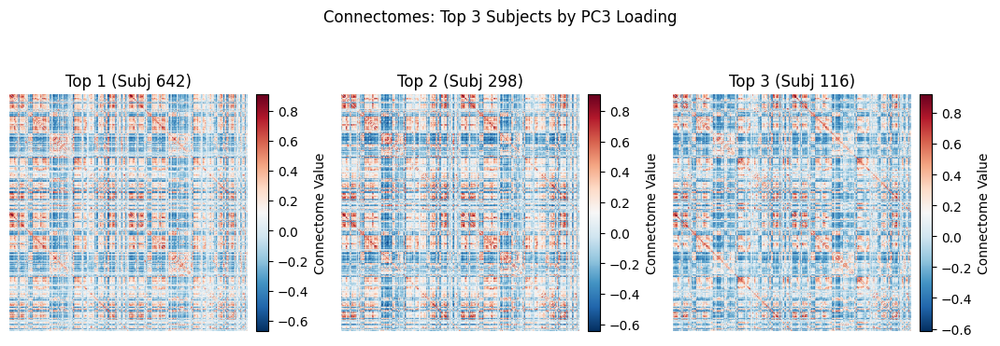

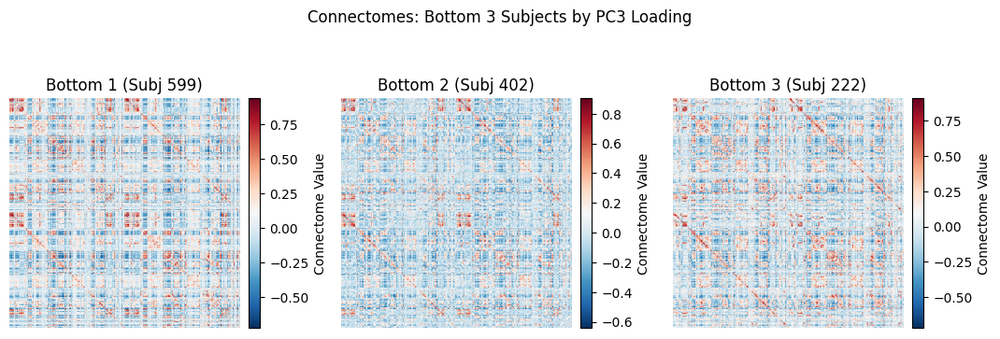

In [120]:
plot_pc_loadings_and_connectomes(
    B=B,
    connectome_type="fc",
    train_matrices=fc_train_matrices, 
    tri2square=tri2square, 
    tri_indices=sc_tri_indices, 
    pc_to_observe=2,  # You may change this value
    n_display=3       # You may change this value
)

# could also look at this deflated by previous PCs

Possible explanation: Much of the variance in the population is driven by some global scaling factor likely driven by systematic fluctuations in the range/magnitude of connectomes. This global PC explains a disproportionately large amount of variance over edges between subjects.

### Edge-wise PCA as an autoencoder (how much info loss?)

Loadings shape (n_components, n_features): (683, 64620)
Train scores shape (n_train_samples, n_components): (683, 683)


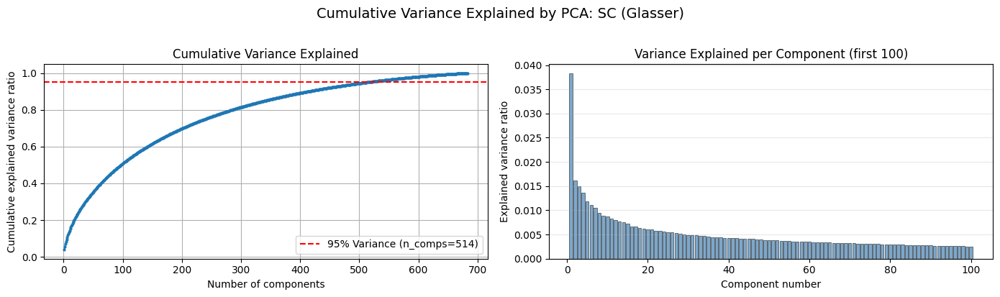

128 components: Train R^2: 0.40679  Val R^2: 0.06451  Test R^2: 0.10323
256 components: Train R^2: 0.59351  Val R^2: 0.01677  Test R^2: 0.07877
512 components: Train R^2: 0.86376  Val R^2: -0.11515  Test R^2: -0.01398


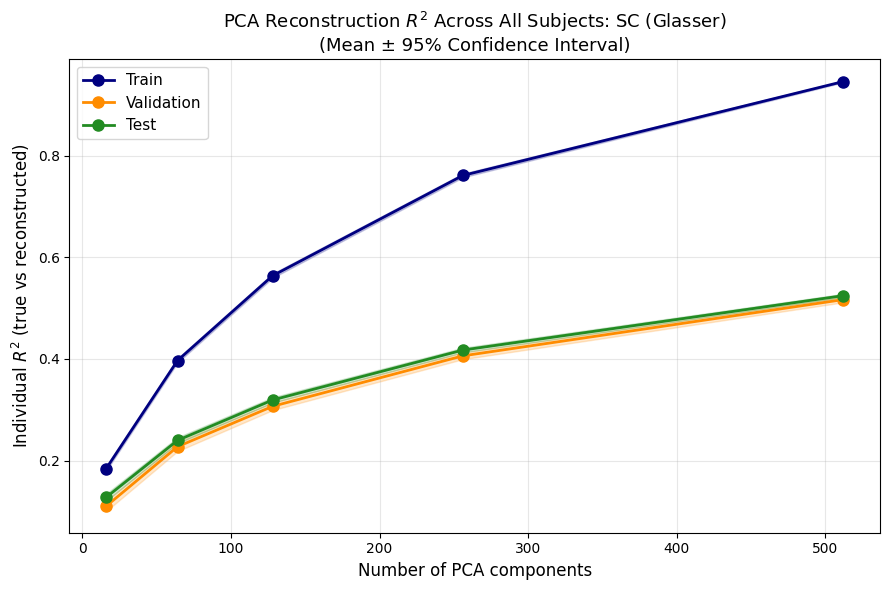

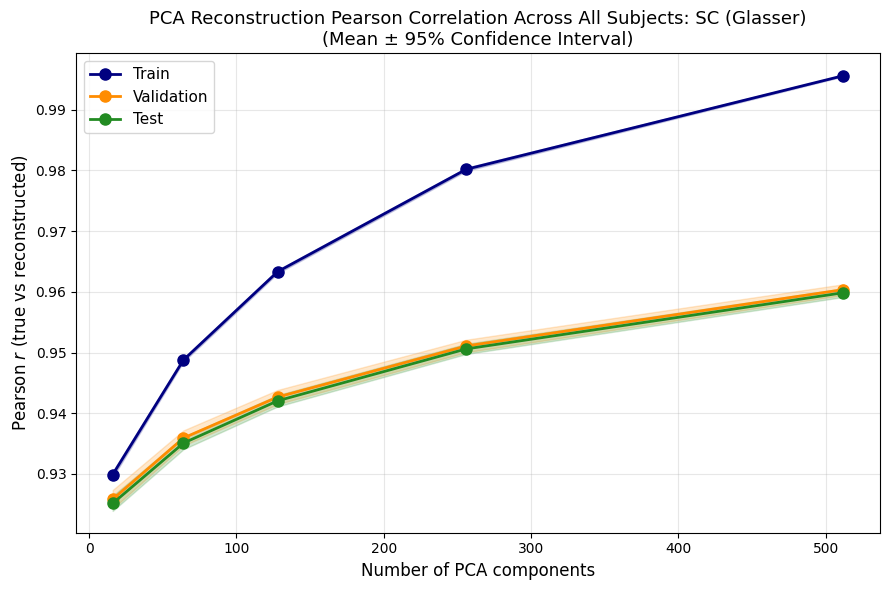

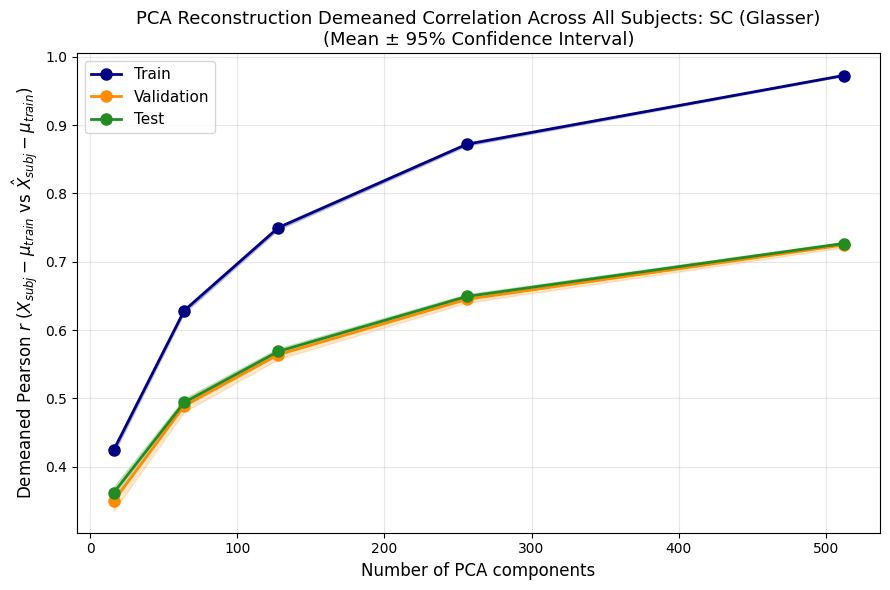

In [40]:
pca, scores_dict, loadings = run_pca_and_plot(
    sc_train_matrices, sc_val_matrices, sc_test_matrices,
    train_ids=HCP_Dataset.trainvaltest_partition_indices["train"], 
    val_ids=HCP_Dataset.trainvaltest_partition_indices["val"], 
    test_ids=HCP_Dataset.trainvaltest_partition_indices["test"],
    modality="SC", parcellation="Glasser")

Loadings shape (n_components, n_features): (683, 64620)
Train scores shape (n_train_samples, n_components): (683, 683)


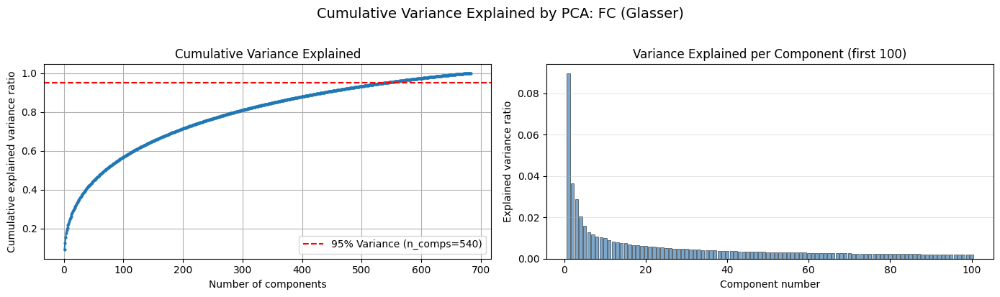

128 components: Train R^2: 0.58634  Val R^2: 0.36337  Test R^2: 0.36033
256 components: Train R^2: 0.74633  Val R^2: 0.41184  Test R^2: 0.40817
512 components: Train R^2: 0.92892  Val R^2: 0.45751  Test R^2: 0.45412


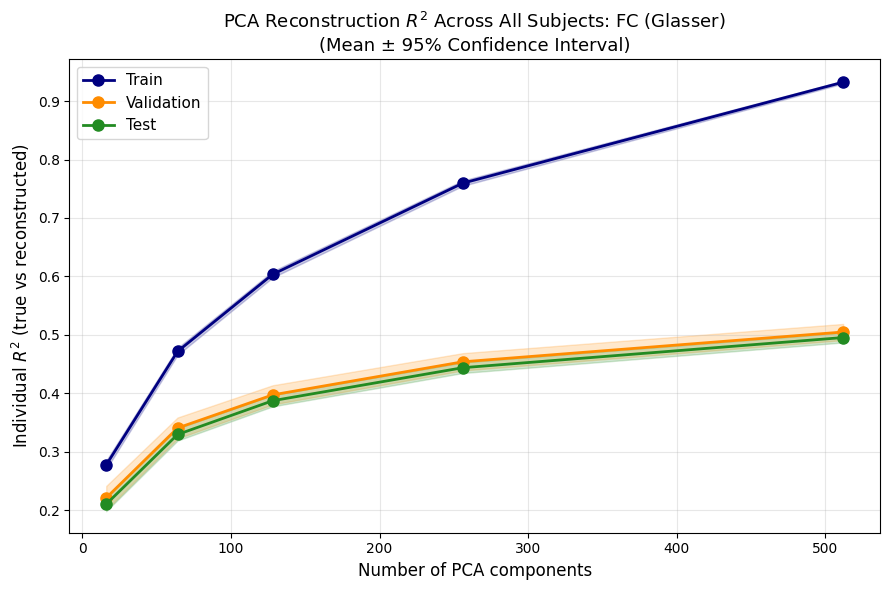

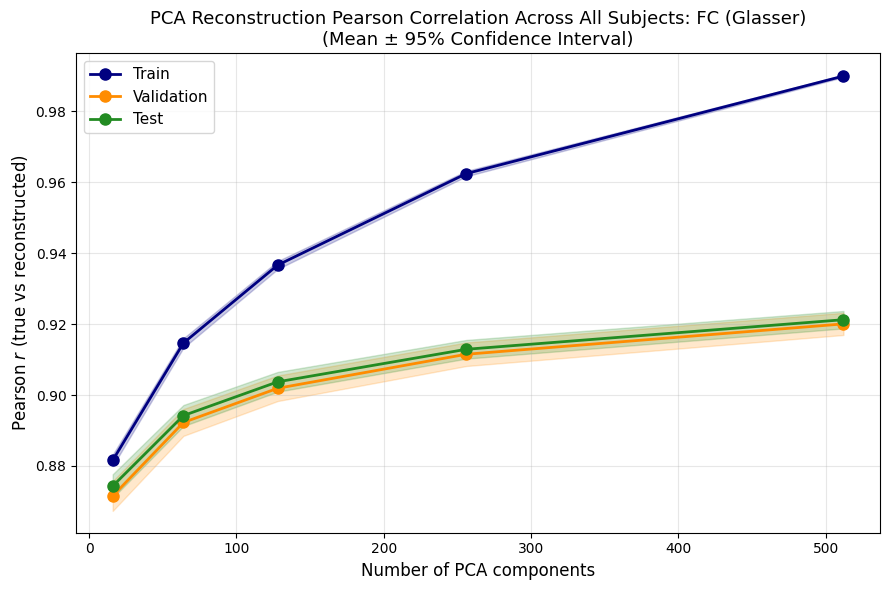

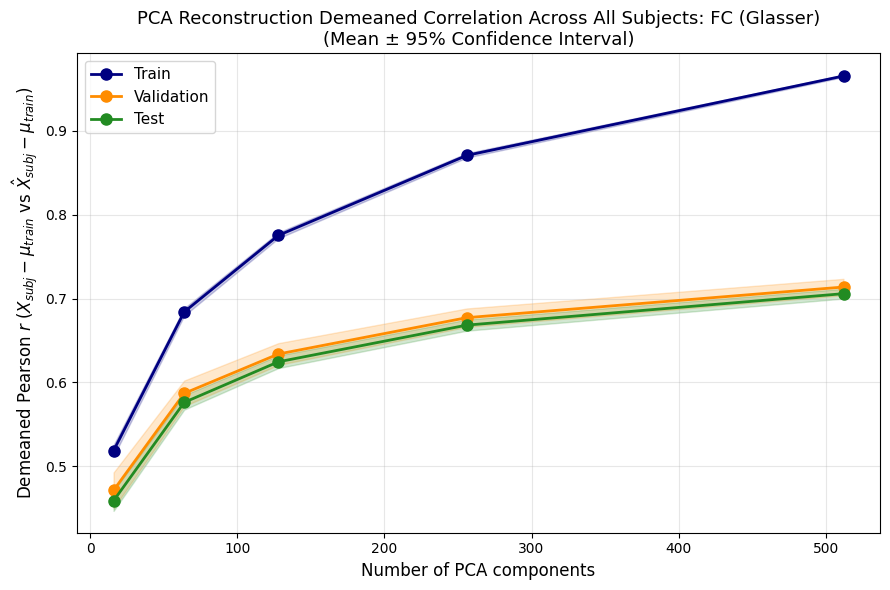

In [41]:
pca, scores_dict, loadings = run_pca_and_plot(
    fc_train_matrices, fc_val_matrices, fc_test_matrices,
    train_ids=HCP_Dataset.trainvaltest_partition_indices["train"], 
    val_ids=HCP_Dataset.trainvaltest_partition_indices["val"], 
    test_ids=HCP_Dataset.trainvaltest_partition_indices["test"],
    modality="FC", parcellation="Glasser")